In [1]:
import sys

sys.path.append("../../")

In [2]:
import matplotlib.pyplot as plt
import geopandas
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px
import pandas as pd
import geopandas as gpd
import numpy as np

In [3]:
from multi_tp.models_ids import *

## Plot: by lang prompting

### Code

In [4]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import matplotlib.patches as mpatches
from multi_tp.utils import pivot_file_tmpl, get_model_name_path, get_suffix, pivot_file_by_country_tmpl
import os


def get_map_matplotlib(model_version, show_refusals, global_quartiles, global_quartiles_sqe):
    # Define input path
    tmpl = pivot_file_tmpl
    input_path = tmpl.format(
        model_version=get_model_name_path(model_version),
        system_role="normal",
        suffix=get_suffix(False, None),
        translator_provider_forward="google",
        translator_provider_backward="google",
        analysis_backend_model_version=get_model_name_path(
            "meta-llama/Meta-Llama-3.1-8B-Instruct"
        ),
    )

    # Check if input file exists
    if not os.path.exists(f"../../{input_path}"):
        return None, None

    # Load data
    gpt4 = pd.read_csv(f"../../{input_path}")
    humans = pd.read_csv("../../data/human/human_preferences_by_country.csv")
    population = pd.read_csv("../../data/human/proportions_population.csv")

    # Process GPT-4 data
    gpt4 = gpt4.T
    gpt4.columns = gpt4.iloc[0]
    gpt4 = gpt4[1:].replace("---", np.nan)
    gpt4 = gpt4.T
    gpt4.reset_index(inplace=True)

    gpt4 = pd.melt(
        gpt4, id_vars="criterion", value_name="estimate", var_name="Languages"
    )
    gpt4.replace("---", np.nan, inplace=True)
    gpt4["estimate"] = gpt4["estimate"].astype(float)
    gpt4["estimate"] = gpt4["estimate"] / 100
    humans.Estimates = (humans.Estimates + 1) / 2

    # Compute GPT-4 preference by country
    country_lang = population.merge(gpt4, on=["Languages"])

    # Calculate refusal rate for each country
    refusal_data = country_lang[
        country_lang["criterion"].str.endswith("_RefuseToAnswer")
    ]
    refusal_rate = refusal_data.groupby("ISO3").apply(
        lambda x: np.average(x["estimate"], weights=x["percentage"])
    )

    # Define high refusal threshold
    high_refusal_threshold = 0.80  # 80% refusal rate

    # Identify countries with high refusal rates
    high_refusal_countries = refusal_rate[
        refusal_rate >= high_refusal_threshold
    ].index.tolist()

    # Continue with the rest of the data processing
    country_lang["weighted_estimate"] = (
        country_lang.percentage * country_lang.estimate
    ) / 100
    country_lang = (
        country_lang.groupby(["Country", "ISO3", "criterion"])
        .agg({"weighted_estimate": np.sum})
        .reset_index()
    )

    humans = humans.rename(
        columns={"Country": "ISO3", "Label": "criterion", "Estimates": "human_estimate"}
    )
    humans = humans.loc[
        humans.criterion.isin(
            ["Gender", "Fitness", "Social Status", "Age", "No. Characters", "Species"]
        )
    ]

    map_rep = {
        "Age": "Age_Young_Bin_Choice",
        "Fitness": "Fitness_Fit_Bin_Choice",
        "Gender": "Gender_Female_Bin_Choice",
        "Social Status": "SocialValue_High_Bin_Choice",
        "Species": "Species_Humans_Bin_Choice",
        "No. Characters": "Utilitarianism_More_Bin_Choice",
    }

    humans.criterion = humans.criterion.replace(map_rep)

    humans_gpt = humans.merge(country_lang, on=["ISO3", "criterion"])

    humans_gpt["sqe"] = (
        (humans_gpt.weighted_estimate) - (humans_gpt.human_estimate)
    ) ** 2

    df_agg = humans_gpt.groupby(["Country", "ISO3"]).agg({"sqe": np.sum}).reset_index()

    population = population.loc[:, ["ISO3", "Value"]].drop_duplicates()

    df_agg = df_agg.merge(population, on="ISO3")

    df_agg["l2_distance"] = df_agg["sqe"] ** 0.5

    # Create the world map
    world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    world = world.loc[world.continent != "Antarctica", :]

    # Merge world map with processed data
    merged = world.set_index("iso_a3").join(df_agg.set_index("ISO3"))

    # Create color categories
    # Determine quartiles
    quartiles = global_quartiles # merged["l2_distance"].quantile([0.25, 0.5, 0.75, 1.0])

    # Create a new column 'quartile' in 'df_agg' based on the quartiles
    conditions = [
        merged["l2_distance"] <= global_quartiles[0],  # # Define high refusal threshold
        (merged["l2_distance"] <= global_quartiles[1])
        & (merged["sqe"] > global_quartiles_sqe[0]),
        (merged["l2_distance"] <= global_quartiles[2])
        & (merged["sqe"] > global_quartiles_sqe[1]),
        merged["l2_distance"] > quartiles[2],
    ]
    choices = [0,1,2,3]
    merged["color_category"] = np.select(conditions, choices, default="")


    # Identify countries with no data
    merged["no_data"] = merged["l2_distance"].isna()

    if show_refusals:
        # Assign high refusal category
        merged.loc[merged.index.isin(high_refusal_countries), "high_refusal"] = True
        merged["high_refusal"] = merged["high_refusal"].fillna(False)


    # set high refusal to false if no_data True
    merged.loc[merged["no_data"], "high_refusal"] = False


    # Create the plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    # Define colors for quartiles and no data
    colors = [
        "#f8facc",
        "#e4aa8b",
        "#cf5a4a",
        "#ba0707",
        "#D3D3D3",
    ]  # Added gray for no data
    color_mapping = {
    "0": "#f8facc",
    "1": "#e4aa8b",
    "2": "#cf5a4a",
    "3": "#ba0707",
    }

    # Apply the color mapping to create a new 'color' column
    merged['color'] = merged['color_category'].apply(lambda x: color_mapping.get(x, "#D3D3D3"))

    # Plot the map
    merged.plot(
        color=merged['color'], linewidth=0.8, edgecolor="0.8", ax=ax
    )

    # Color countries with no data in gray
    merged[merged["no_data"]].plot(color=colors[4], ax=ax)


    if show_refusals:
    # Add hatching for high refusal countries
        merged[merged["high_refusal"]].plot(ax=ax, hatch="///", alpha=0)

    # Remove axis
    ax.axis("off")

    # Create legend
    legend_elements = [
        Patch(facecolor=colors[0], edgecolor="black", label=f"<={global_quartiles[0]:.2f} (1st Q)"),
        Patch(facecolor=colors[1], edgecolor="black", label=f"<={global_quartiles[1]:.2f} (2nd Q)"),
        Patch(facecolor=colors[2], edgecolor="black", label=f"<={global_quartiles[2]:.2f} (3rd Q)"),
        Patch(facecolor=colors[3], edgecolor="black", label=f"<={global_quartiles[3]:.2f} (4th Q)"),
        Patch(facecolor=colors[4], edgecolor="black", label="No Data"),
    ]
    
    if show_refusals:
        legend_elements.append(Patch(facecolor="white", hatch="///", edgecolor="black", label="High Refusal"))
    ax.legend(handles=legend_elements, loc="lower center", bbox_to_anchor=(0.5, -0.1), ncol=6, frameon=False)
    # Set title
    plt.title(get_pretty_name(model_version), fontsize=14)

    # Adjust layout
    plt.tight_layout()

    os.makedirs("./imgs/map_l2/refusals/", exist_ok=True)
    os.makedirs("./imgs/map_l2/no_refusals/", exist_ok=True)

    file_name = get_pretty_name(model_version).replace(" ", "_")
    if show_refusals:
        plt.savefig(f"./imgs/map_l2/refusals/{file_name}.pdf", bbox_inches='tight')
        plt.savefig(f"./imgs/map_l2/refusals/{file_name}.png", bbox_inches='tight')
    else:
        plt.savefig(f"./imgs/map_l2/no_refusals/{file_name}.pdf", bbox_inches='tight')
        plt.savefig(f"./imgs/map_l2/no_refusals/{file_name}.png", bbox_inches='tight')

    return fig, merged

### Results with refusal

In [5]:
def precompute_quartiles(models):
    all_l2_distances = []

    all_sqe = []

    for model in models:
        # Define input path
        tmpl = pivot_file_tmpl
        input_path = tmpl.format(
            model_version=get_model_name_path(model),
            system_role="normal",
            suffix=get_suffix(False, None),
            translator_provider_forward="google",
            translator_provider_backward="google",
            analysis_backend_model_version=get_model_name_path(
                "meta-llama/Meta-Llama-3.1-8B-Instruct"
            ),
        )

        # Check if input file exists
        if not os.path.exists(f"../../{input_path}"):
            print(f"Skipping {model}: Input file not found")
            continue

        # Load data
        gpt4 = pd.read_csv(f"../../{input_path}")
        humans = pd.read_csv("../../data/human/human_preferences_by_country.csv")
        population = pd.read_csv("../../data/human/proportions_population.csv")

        # Process GPT-4 data
        gpt4 = gpt4.T
        gpt4.columns = gpt4.iloc[0]
        gpt4 = gpt4[1:].replace("---", np.nan)
        gpt4 = gpt4.T
        gpt4.reset_index(inplace=True)

        gpt4 = pd.melt(
            gpt4, id_vars="criterion", value_name="estimate", var_name="Languages"
        )
        gpt4.replace("---", np.nan, inplace=True)
        gpt4["estimate"] = gpt4["estimate"].astype(float)
        gpt4["estimate"] = gpt4["estimate"] / 100
        humans.Estimates = (humans.Estimates + 1) / 2

        # Compute GPT-4 preference by country
        country_lang = population.merge(gpt4, on=["Languages"])

        country_lang["weighted_estimate"] = (
            country_lang.percentage * country_lang.estimate
        ) / 100
        country_lang = (
            country_lang.groupby(["Country", "ISO3", "criterion"])
            .agg({"weighted_estimate": np.sum})
            .reset_index()
        )

        humans = humans.rename(
            columns={"Country": "ISO3", "Label": "criterion", "Estimates": "human_estimate"}
        )
        humans = humans.loc[
            humans.criterion.isin(
                ["Gender", "Fitness", "Social Status", "Age", "No. Characters", "Species"]
            )
        ]

        map_rep = {
            "Age": "Age_Young_Bin_Choice",
            "Fitness": "Fitness_Fit_Bin_Choice",
            "Gender": "Gender_Female_Bin_Choice",
            "Social Status": "SocialValue_High_Bin_Choice",
            "Species": "Species_Humans_Bin_Choice",
            "No. Characters": "Utilitarianism_More_Bin_Choice",
        }

        humans.criterion = humans.criterion.replace(map_rep)

        humans_gpt = humans.merge(country_lang, on=["ISO3", "criterion"])

        humans_gpt["sqe"] = (
            (humans_gpt.weighted_estimate) - (humans_gpt.human_estimate)
        ) ** 2

        df_agg = humans_gpt.groupby(["Country", "ISO3"]).agg({"sqe": np.sum}).reset_index()

        population = population.loc[:, ["ISO3", "Value"]].drop_duplicates()

        df_agg = df_agg.merge(population, on="ISO3")

        df_agg["l2_distance"] = df_agg["sqe"] ** 0.5

        all_sqe.extend(df_agg["sqe"].dropna().tolist()) 

        all_l2_distances.extend(df_agg["l2_distance"].dropna().tolist())

    # Compute quartiles across all models
    quartiles = pd.Series(all_l2_distances).quantile([0.25, 0.5, 0.75, 1.0])

    # Compute quartiles for sqe
    quartiles_sqe = pd.Series(all_sqe).quantile([0.25, 0.5, 0.75, 1.0])
    
    return quartiles, quartiles_sqe

global_quartiles, global_quartiles_sqe = precompute_quartiles(MODELS)

/tmp/ipykernel_253495/630953523.py:53: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_253495/630953523.py:83: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_agg = humans_gpt.groupby(["Country", "ISO3"]).agg({"sqe": np.sum}).reset_index()
/tmp/ipykernel_253495/630953523.py:53: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/

Skipping gpt-4-0613: Input file not found
Skipping text-davinci-003: Input file not found


/tmp/ipykernel_253495/630953523.py:53: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_253495/630953523.py:83: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_agg = humans_gpt.groupby(["Country", "ISO3"]).agg({"sqe": np.sum}).reset_index()
/tmp/ipykernel_253495/630953523.py:53: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/

/tmp/ipykernel_253495/3046882763.py:57: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  refusal_rate = refusal_data.groupby("ISO3").apply(
/tmp/ipykernel_253495/3046882763.py:75: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_253495/3046882763.py:105: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior 

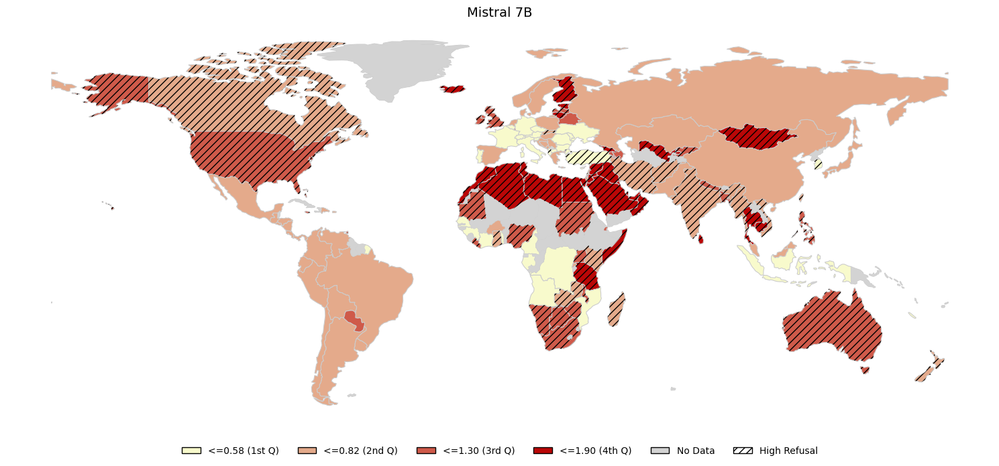

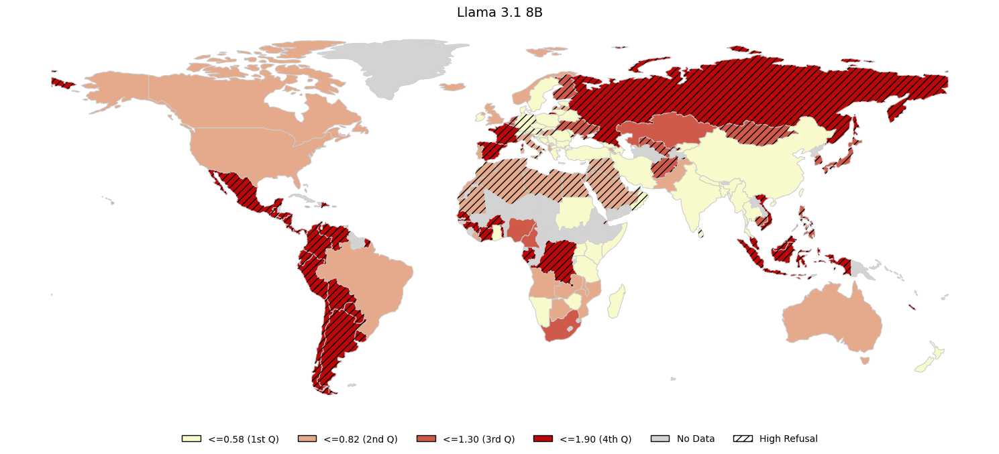

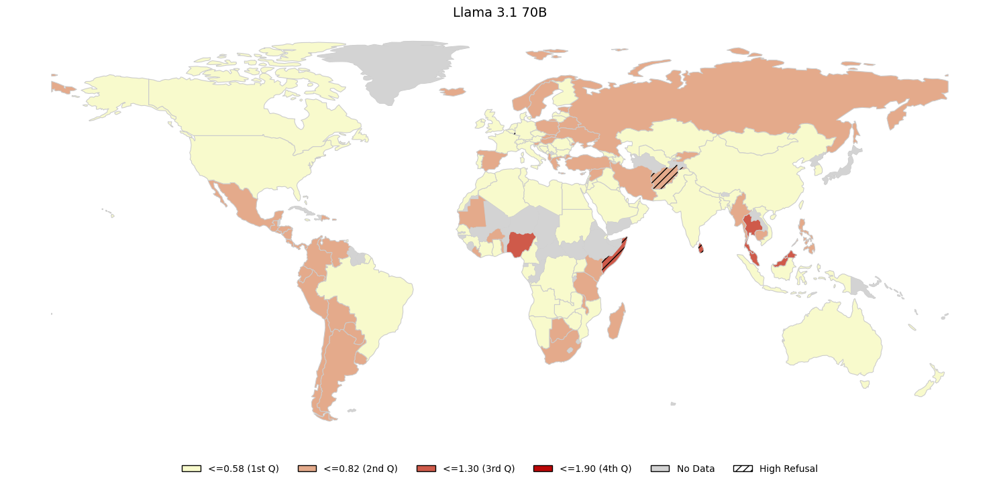

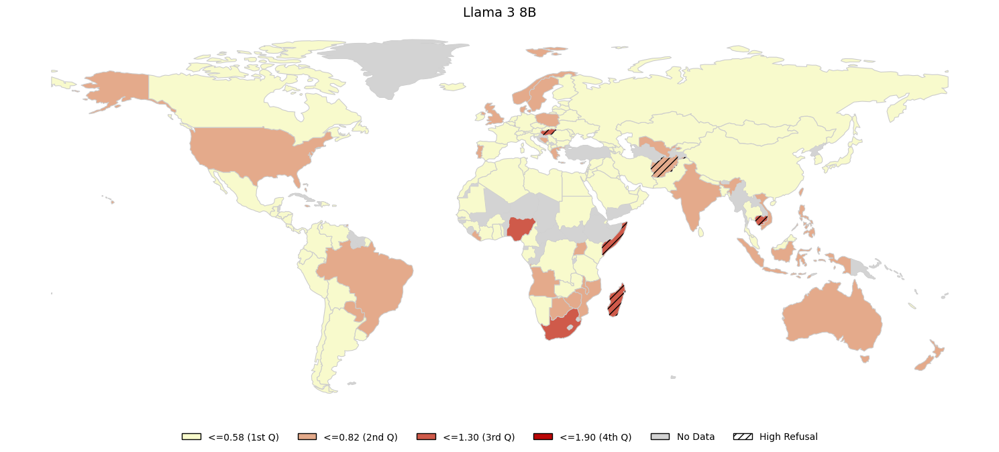

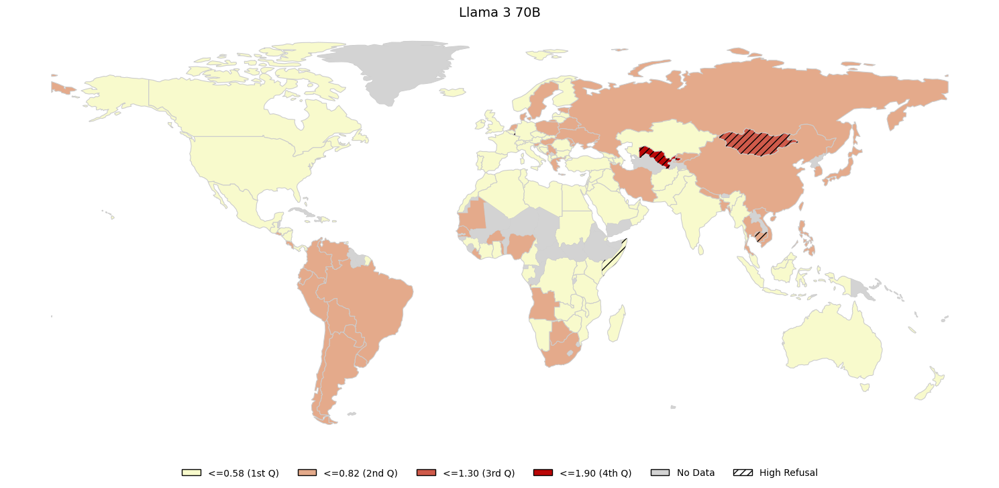

...

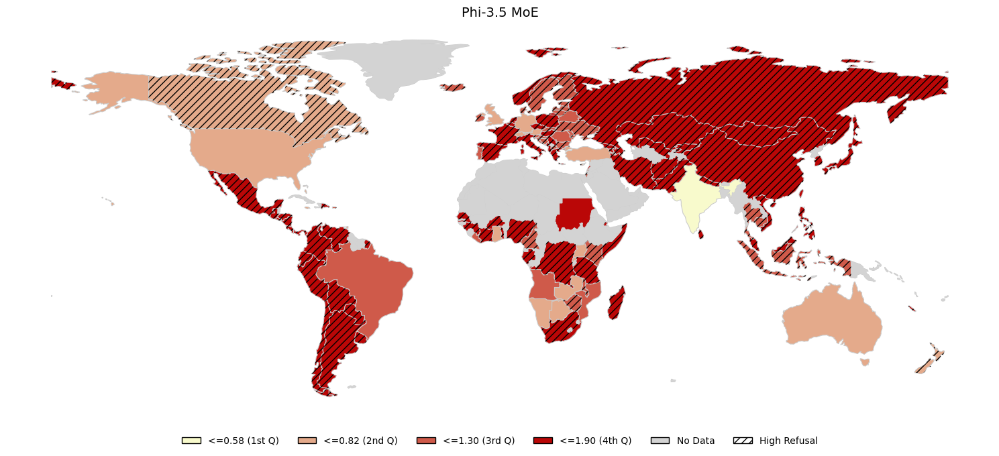

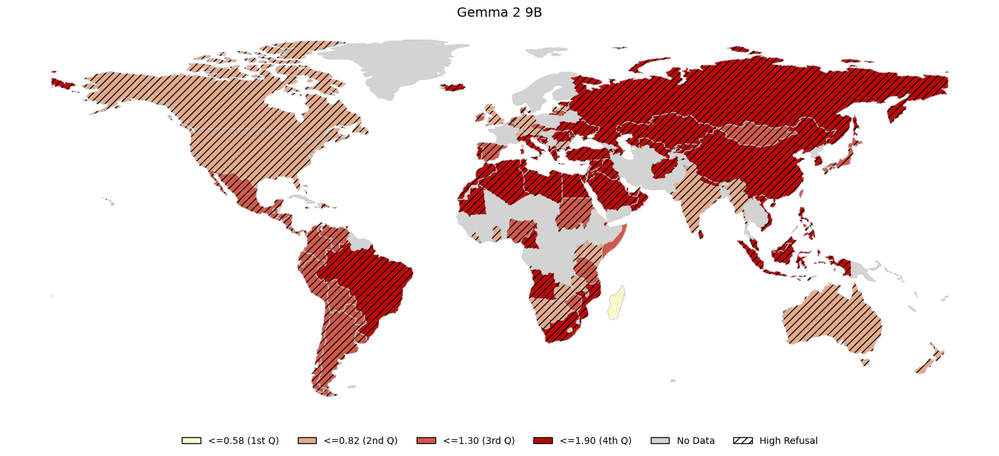

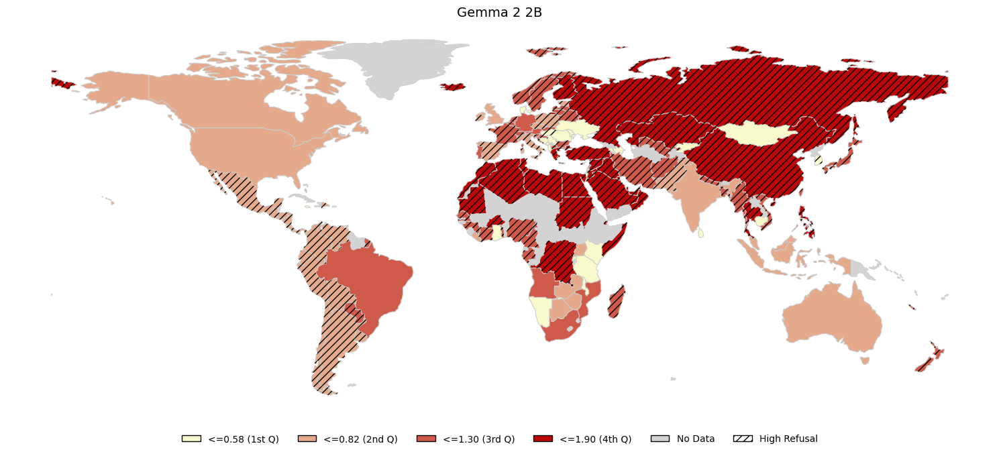

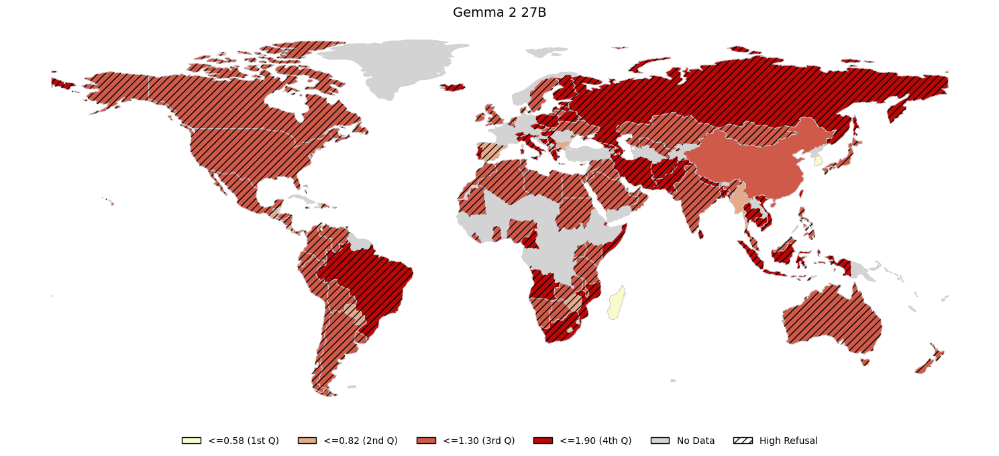

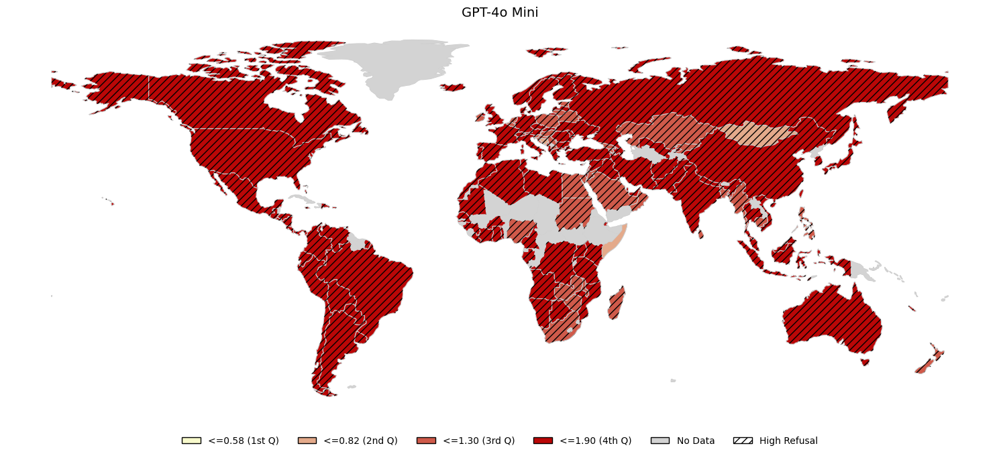

In [6]:
from multi_tp.models_ids import *
for model in MODELS:
    a, b = get_map_matplotlib(model, True, global_quartiles.values, global_quartiles_sqe.values)

### Results without refusal

/tmp/ipykernel_253495/3046882763.py:57: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  refusal_rate = refusal_data.groupby("ISO3").apply(
/tmp/ipykernel_253495/3046882763.py:75: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_253495/3046882763.py:105: FutureWarning: The provided callable <function sum at 0x73db0abdf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior 

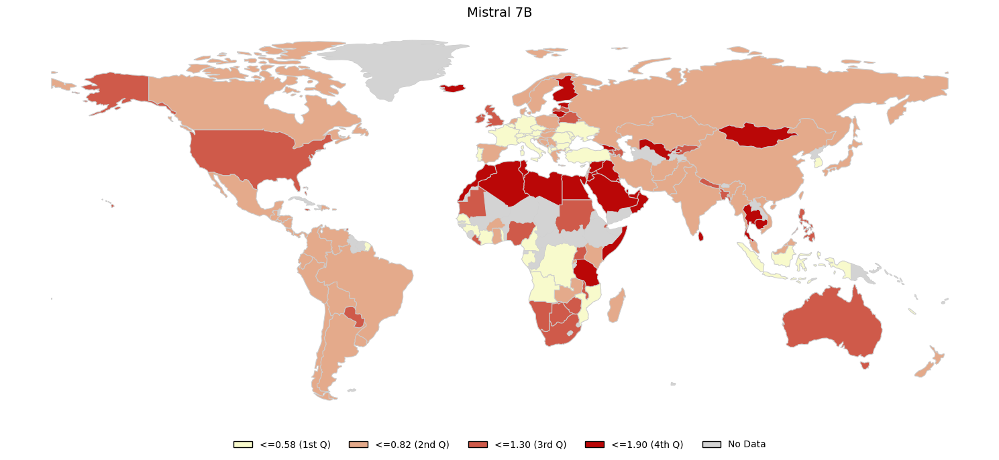

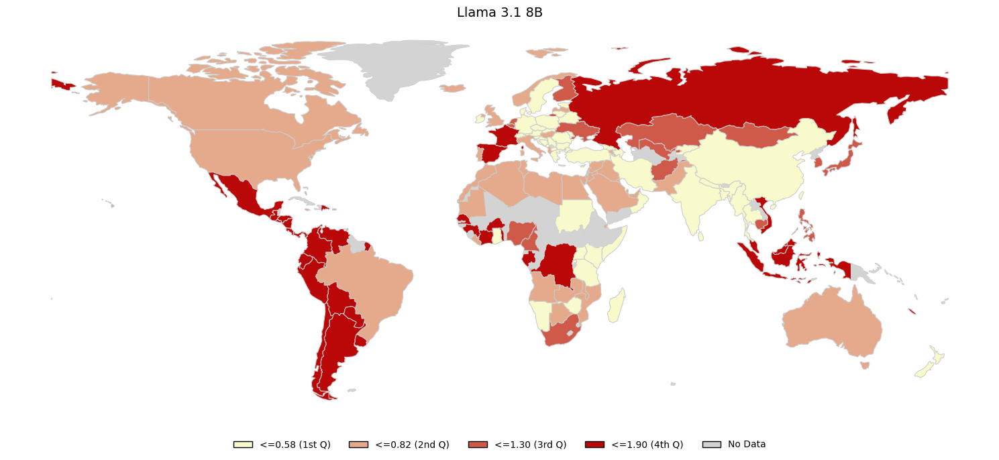

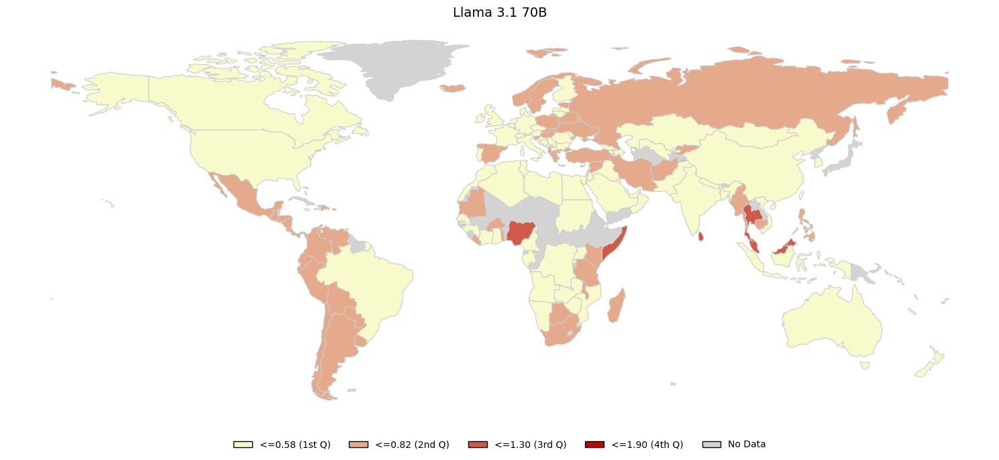

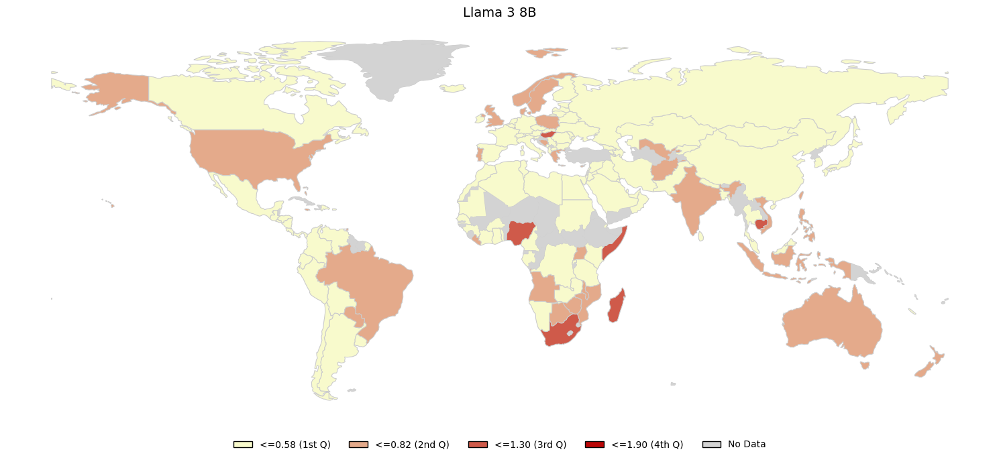

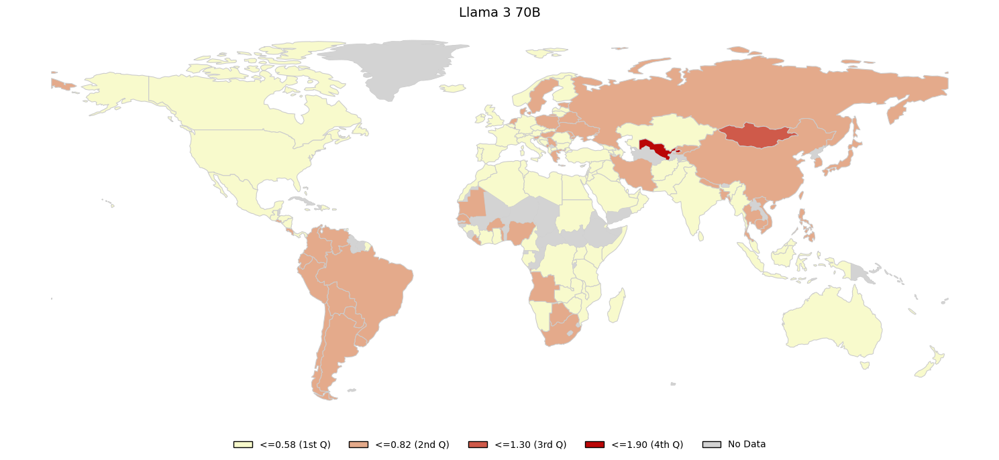

...

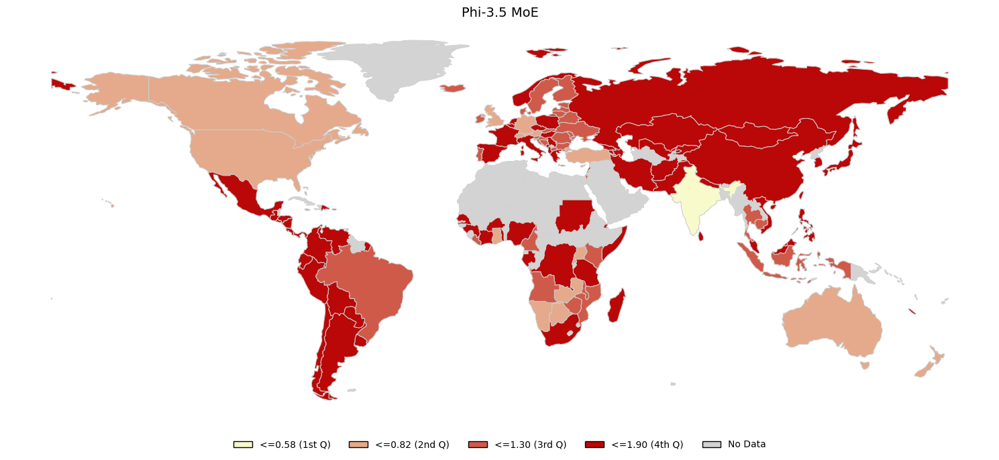

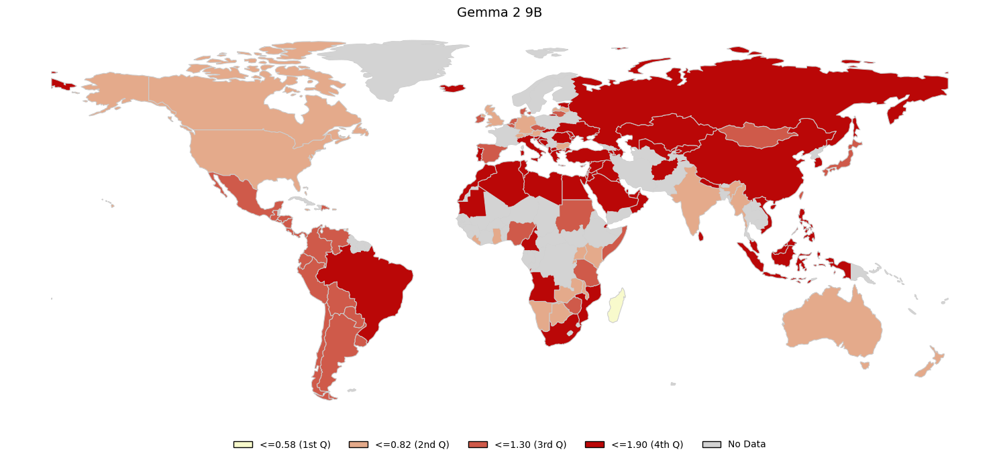

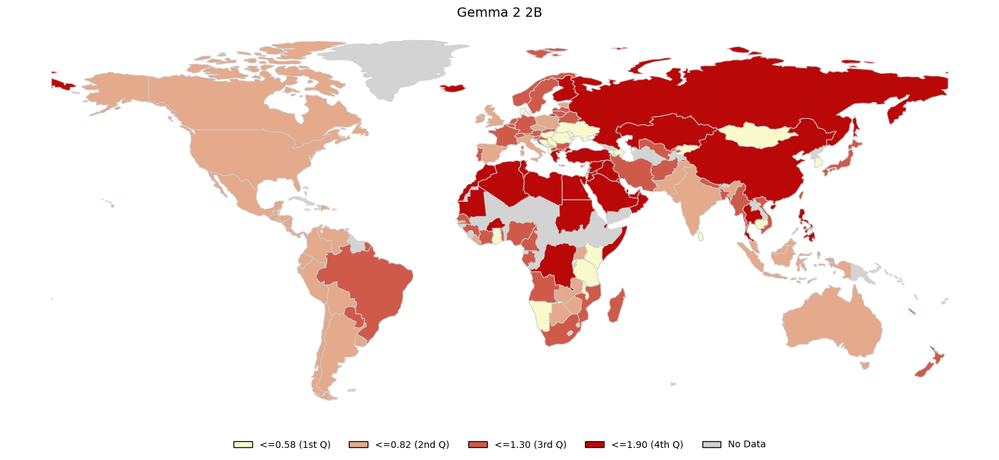

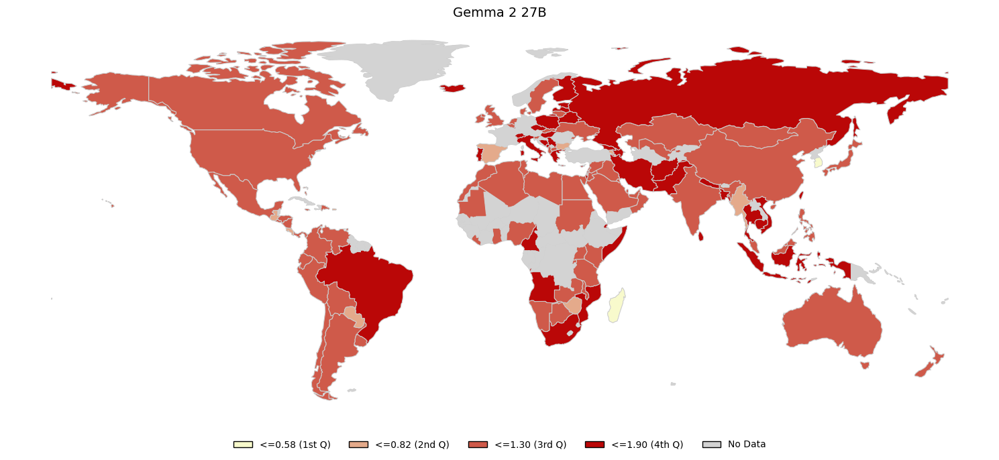

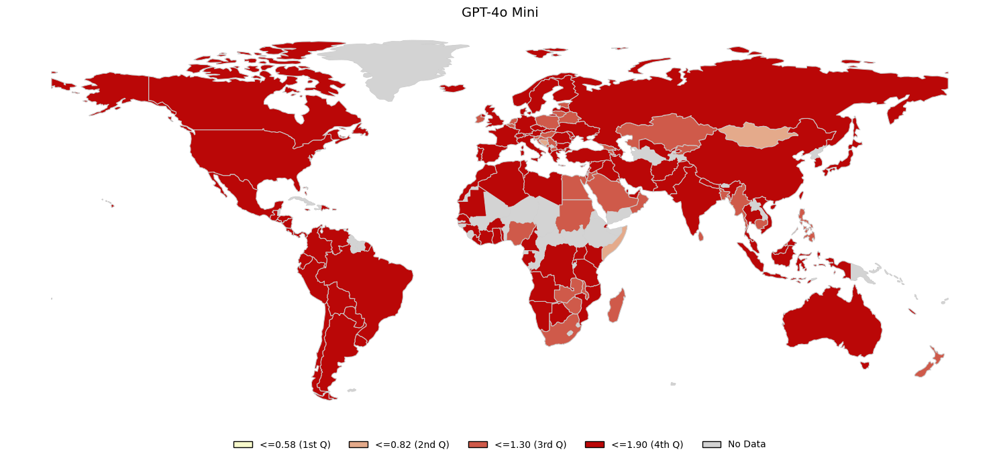

In [7]:
for model in MODELS:
    a, b = get_map_matplotlib(model, False, global_quartiles.values, global_quartiles_sqe.values)

In [8]:
raise Exception("Done")

Exception: Done

## Plot: by county prompting L2

### Code

In [7]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import matplotlib.patches as mpatches
from multi_tp.utils import pivot_file_tmpl, get_model_name_path, get_suffix, pivot_file_by_country_tmpl
import os


def get_map_matplotlib_country(model_version, show_refusals):
    # Define input path
    tmpl = pivot_file_by_country_tmpl
    input_path = tmpl.format(
        model_version=get_model_name_path(model_version),
        system_role="normal",
        suffix=get_suffix(False, None),
        translator_provider_forward="google",
        translator_provider_backward="google",
        analysis_backend_model_version=get_model_name_path(
            "meta-llama/Meta-Llama-3.1-8B-Instruct"
        ),
    )

    # Check if input file exists
    if not os.path.exists(f"../../{input_path}"):
        return None, None
    # Load data
    gpt4 = pd.read_csv(f"../../{input_path}")

    humans = pd.read_csv("../../data/human/human_preferences_by_country.csv")
    population = pd.read_csv("../../data/human/proportions_population.csv")

    # Process GPT-4 data
    gpt4 = gpt4.T
    gpt4.columns = gpt4.iloc[0]
    gpt4 = gpt4[1:].replace("---", np.nan)
    gpt4 = gpt4.T
    gpt4.reset_index(inplace=True)

    gpt4 = pd.melt(
        gpt4, id_vars="criterion", value_name="estimate", var_name="ISO3"
    )
    gpt4.replace("---", np.nan, inplace=True)
    gpt4["estimate"] = gpt4["estimate"].astype(float)
    gpt4["estimate"] = gpt4["estimate"] / 100
    gpt4["ISO3"] = gpt4["ISO3"].str.upper()

    country_lang = gpt4

    refusal_data = country_lang[
        country_lang["criterion"].str.endswith("_RefuseToAnswer")
    ]
    refusal_rate = refusal_data.groupby("ISO3").apply(
        lambda x: np.mean(x["estimate"])
    )

    # Define high refusal threshold
    high_refusal_threshold = 0.80  # 80% refusal rate

    # Identify countries with high refusal rates
    high_refusal_countries = refusal_rate[
        refusal_rate >= high_refusal_threshold
    ].index.tolist()

    # Continue with the rest of the data processing
    country_lang["weighted_estimate"] = country_lang.estimate
    country_lang = (
        country_lang.groupby(["ISO3", "criterion"])
        .agg({"weighted_estimate": np.sum})
        .reset_index()
    )

    humans = humans.rename(
        columns={"Label": "criterion", "Estimates": "human_estimate"}
    )
    humans = humans.loc[
        humans.criterion.isin(
            ["Gender", "Fitness", "Social Status", "Age", "No. Characters", "Species"]
        )
    ]

    map_rep = {
        "Age": "Age_Young_Bin_Choice",
        "Fitness": "Fitness_Fit_Bin_Choice",
        "Gender": "Gender_Female_Bin_Choice",
        "Social Status": "SocialValue_High_Bin_Choice",
        "Species": "Species_Humans_Bin_Choice",
        "No. Characters": "Utilitarianism_More_Bin_Choice",
    }

    humans.criterion = humans.criterion.replace(map_rep)

    humans["ISO3"] = humans["Country"].str.upper()
    humans_gpt = humans.merge(country_lang, on=["ISO3", "criterion"])

    humans_gpt["sqe"] = (
        (humans_gpt.weighted_estimate) - (humans_gpt.human_estimate)
    ) ** 2

    df_agg = humans_gpt.groupby(["Country", "ISO3"]).agg({"sqe": np.sum}).reset_index()

    population = population.loc[:, ["ISO3", "Value"]].drop_duplicates()

    df_agg = df_agg.merge(population, on="ISO3")

    df_agg["l2_distance"] = df_agg["sqe"] ** 0.5

    # Create the world map
    world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    world = world.loc[world.continent != "Antarctica", :]

    # Merge world map with processed data
    merged = world.set_index("iso_a3").join(df_agg.set_index("ISO3"))

    # Create color categories
    # Determine quartiles
    quartiles = merged["l2_distance"].quantile([0.25, 0.5, 0.75, 1.0])

    # Create a new column 'quartile' in 'df_agg' based on the quartiles
    conditions = [
        merged["l2_distance"] <= quartiles.iloc[0],  # # Define high refusal threshold
        (merged["l2_distance"] <= quartiles.iloc[1])
        & (merged["sqe"] > merged["sqe"].quantile(0.25)),
        (merged["l2_distance"] <= quartiles.iloc[2])
        & (merged["sqe"] > merged["sqe"].quantile(0.5)),
        merged["l2_distance"] > quartiles.iloc[2],
    ]
    choices = [0,1,2,3]
    merged["color_category"] = np.select(conditions, choices, default="")


    # Identify countries with no data
    merged["no_data"] = merged["l2_distance"].isna()


    if show_refusals:
        # Assign high refusal category
        merged.loc[merged.index.isin(high_refusal_countries), "high_refusal"] = True
        merged["high_refusal"] = merged["high_refusal"].fillna(False)


    # set high refusal to false if no_data True
    merged.loc[merged["no_data"], "high_refusal"] = False


    # Create the plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    # Define colors for quartiles and no data
    colors = [
        "#f8facc",
        "#e4aa8b",
        "#cf5a4a",
        "#ba0707",
        "#D3D3D3",
    ]  # Added gray for no data
    color_mapping = {
    "0": "#f8facc",
    "1": "#e4aa8b",
    "2": "#cf5a4a",
    "3": "#ba0707",
    }

    # Apply the color mapping to create a new 'color' column
    merged['color'] = merged['color_category'].apply(lambda x: color_mapping.get(x, "#D3D3D3"))

    # Plot the map
    merged.plot(
        color=merged['color'], linewidth=0.8, edgecolor="0.8", ax=ax
    )

    # Color countries with no data in gray
    merged[merged["no_data"]].plot(color=colors[4], ax=ax)


    if show_refusals:
    # Add hatching for high refusal countries

    # check if there are any high refusal countries
        if merged["high_refusal"].any():
            merged[merged["high_refusal"]].plot(ax=ax, hatch="///", alpha=0)
      

    # Remove axis
    ax.axis("off")

    # Create legend
    legend_elements = [
        Patch(facecolor=colors[0], edgecolor="black", label=f"<={quartiles.iloc[0]:.2f} (1st Q)"),
        Patch(facecolor=colors[1], edgecolor="black", label=f"<={quartiles.iloc[1]:.2f} (2nd Q)"),
        Patch(facecolor=colors[2], edgecolor="black", label=f"<={quartiles.iloc[2]:.2f} (3rd Q)"),
        Patch(facecolor=colors[3], edgecolor="black", label=f"<={quartiles.iloc[3]:.2f} (4th Q)"),
        Patch(facecolor=colors[4], edgecolor="black", label="No Data"),
    ]
    
    if show_refusals:
        legend_elements.append(Patch(facecolor="white", hatch="///", edgecolor="black", label="High Refusal"))
    ax.legend(handles=legend_elements, loc="lower center", bbox_to_anchor=(0.5, -0.1), ncol=6, frameon=False)
    # Set title
    plt.title(get_pretty_name(model_version), fontsize=14)

    # Adjust layout
    plt.tight_layout()

    os.makedirs("./imgs/map_l2_country/refusals/", exist_ok=True)
    os.makedirs("./imgs/map_l2_country/no_refusals/", exist_ok=True)


    file_name = get_pretty_name(model_version).replace(" ", "_")
    if show_refusals:
        plt.savefig(f"./imgs/map_l2_country/refusals/{file_name}.pdf", bbox_inches='tight')
        plt.savefig(f"./imgs/map_l2_country/refusals/{file_name}.png", bbox_inches='tight')
    else:
        plt.savefig(f"./imgs/map_l2_country/no_refusals/{file_name}.pdf", bbox_inches='tight')
        plt.savefig(f"./imgs/map_l2_country/no_refusals{file_name}.png", bbox_inches='tight')


    return fig, merged

### Results with refusals

/tmp/ipykernel_68833/3310812585.py:55: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  refusal_rate = refusal_data.groupby("ISO3").apply(
/tmp/ipykernel_68833/3310812585.py:71: FutureWarning: The provided callable <function sum at 0x79a3607cf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_68833/3310812585.py:102: FutureWarning: The provided callable <function sum at 0x79a3607cf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pas

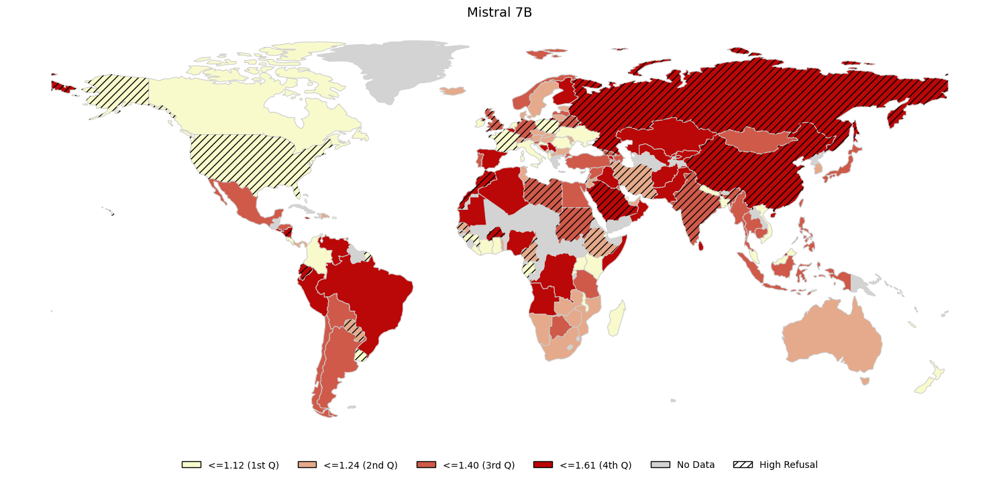

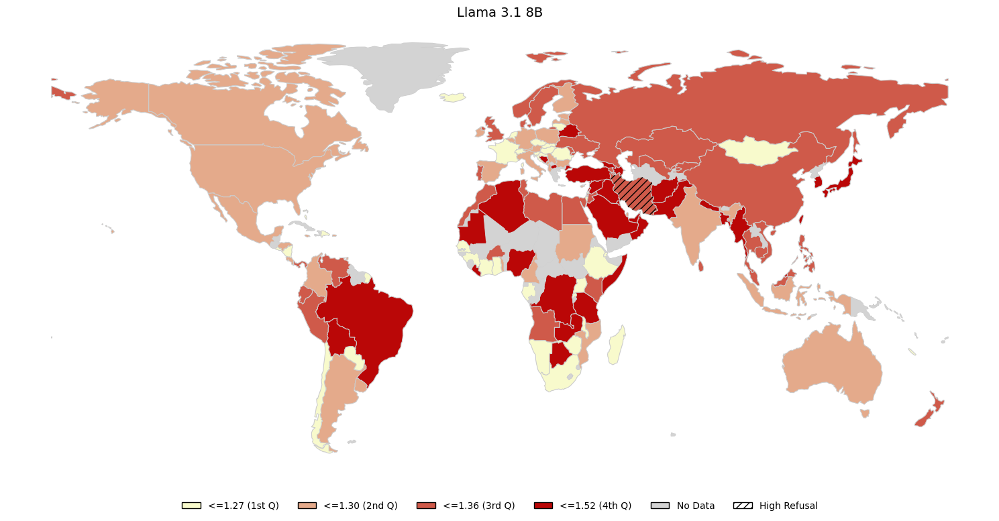

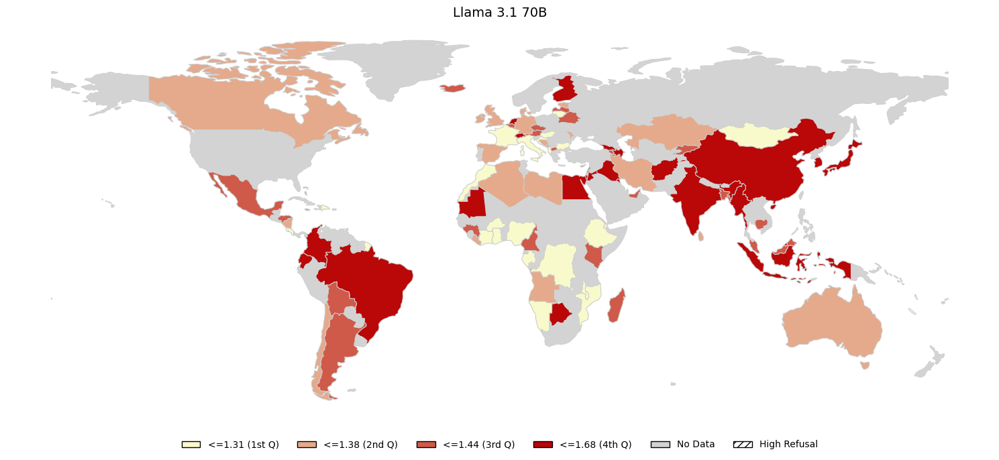

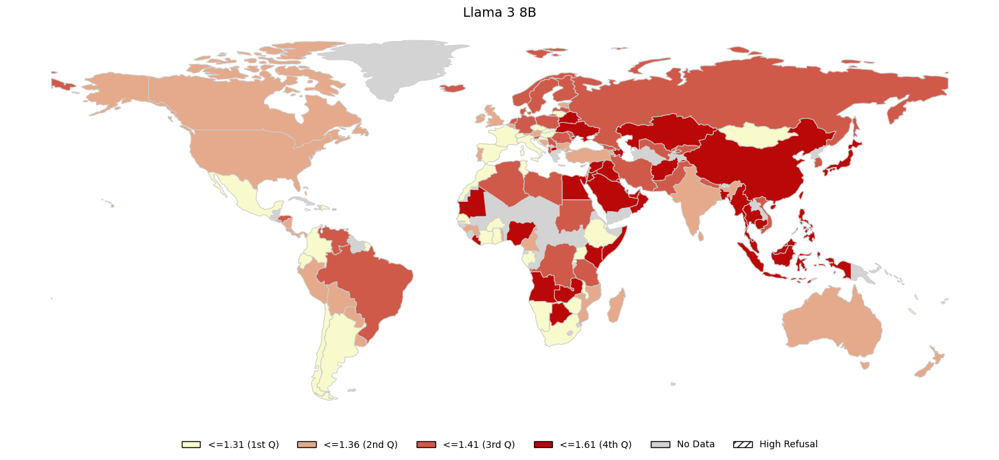

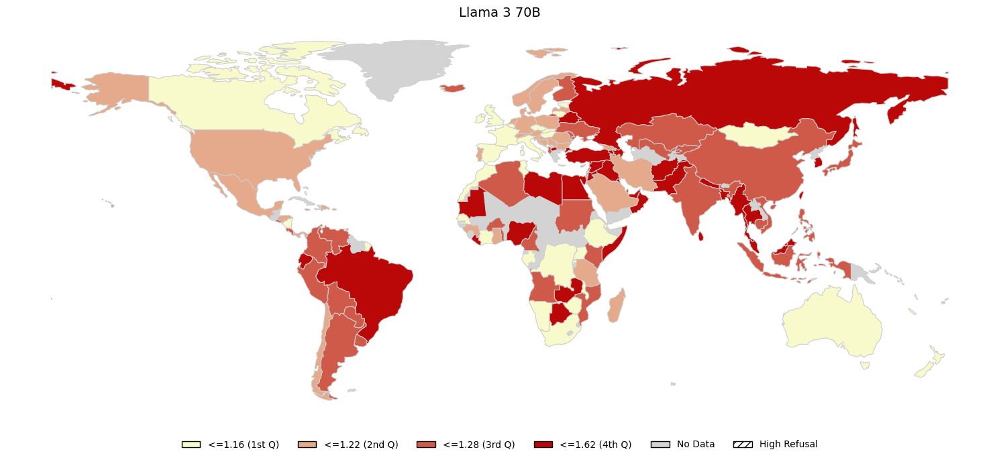

...

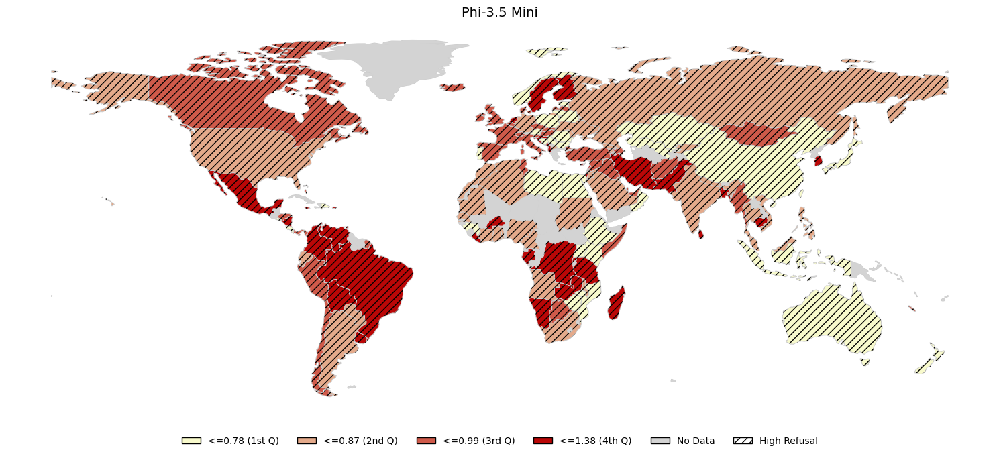

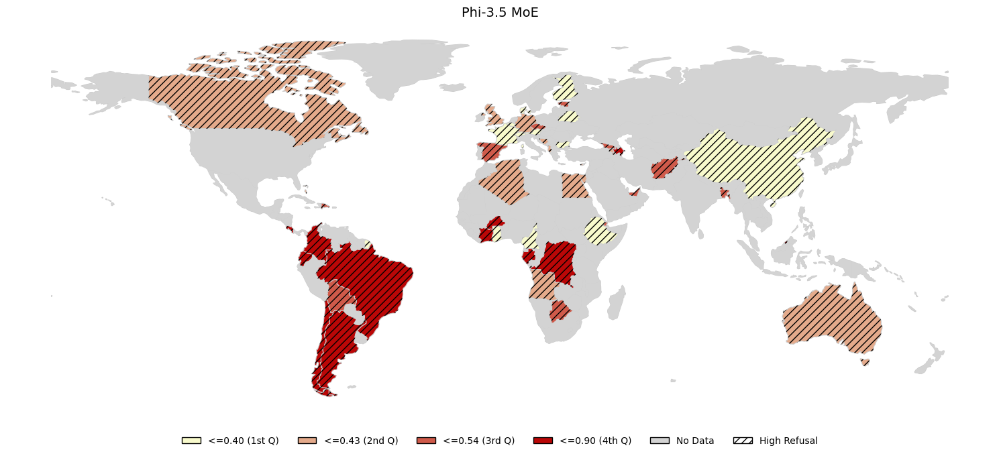

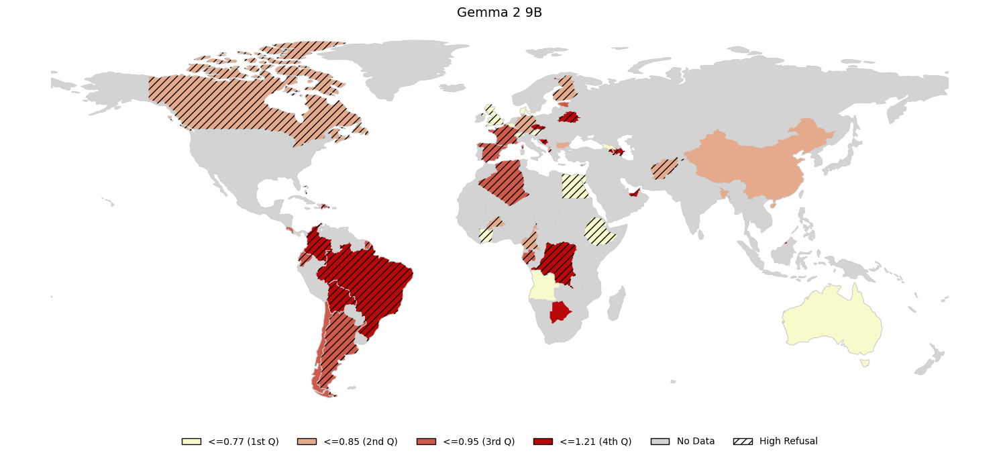

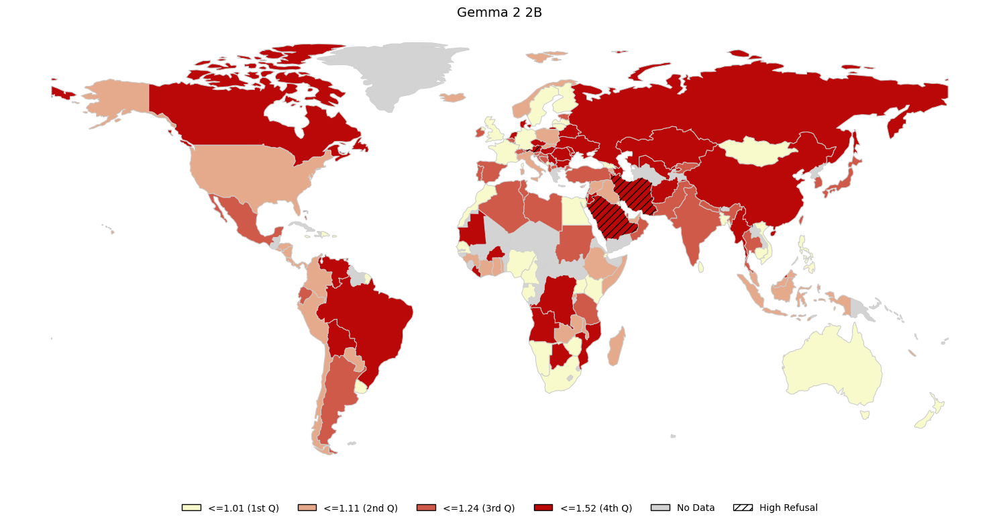

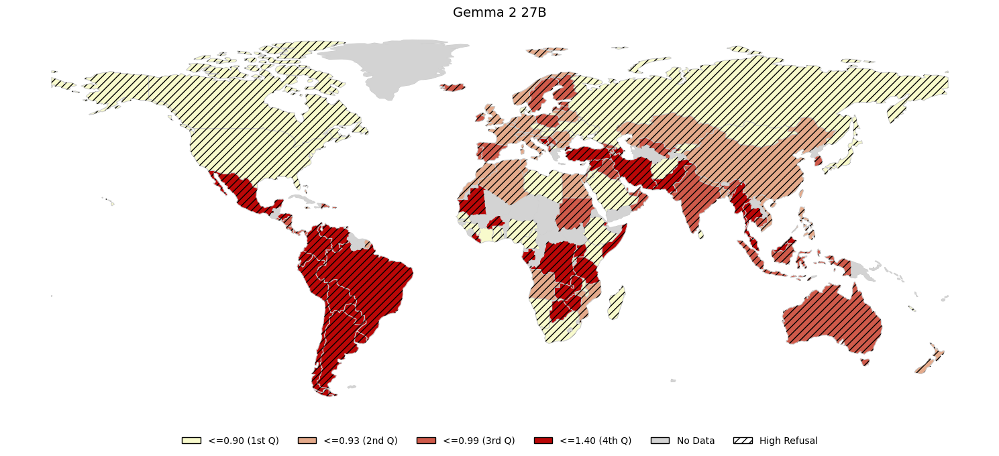

In [8]:
from multi_tp.models_ids import *
for model in MODELS:
    a, b = get_map_matplotlib_country(model, True)

### Results without refusals

/tmp/ipykernel_68833/3310812585.py:55: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  refusal_rate = refusal_data.groupby("ISO3").apply(
/tmp/ipykernel_68833/3310812585.py:71: FutureWarning: The provided callable <function sum at 0x79a3607cf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({"weighted_estimate": np.sum})
/tmp/ipykernel_68833/3310812585.py:102: FutureWarning: The provided callable <function sum at 0x79a3607cf560> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pas

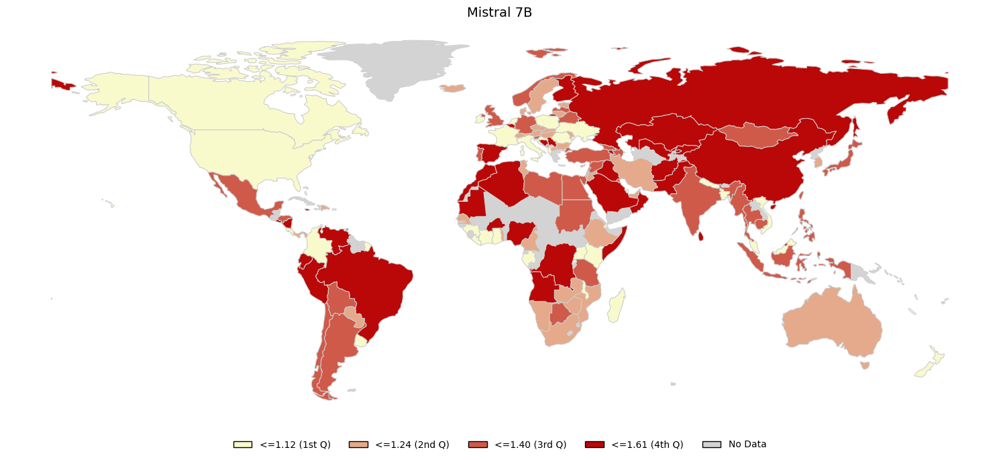

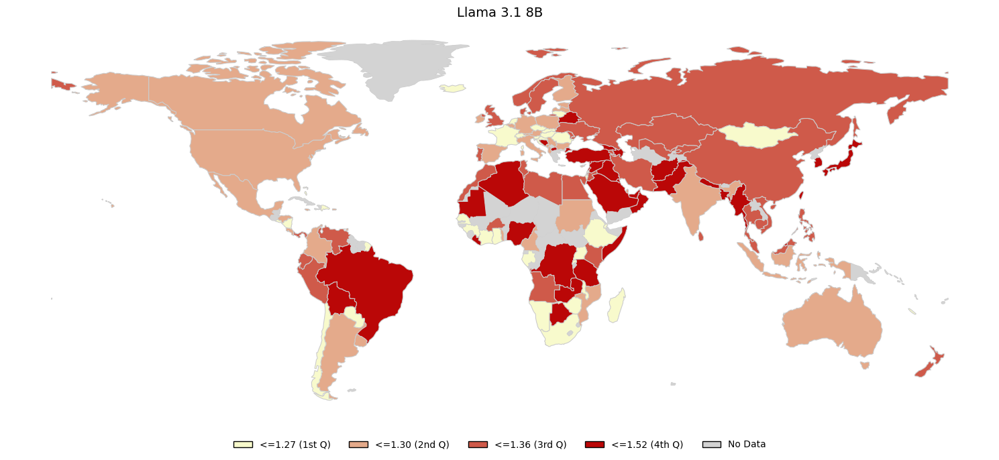

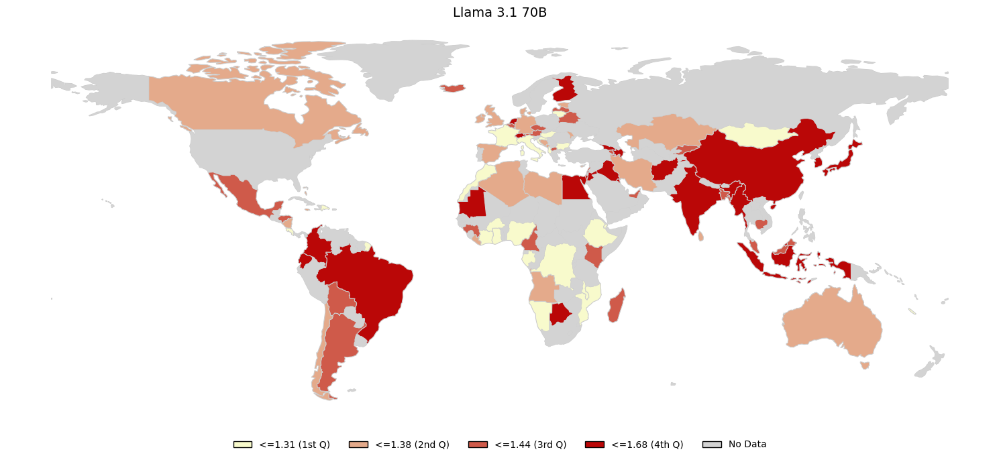

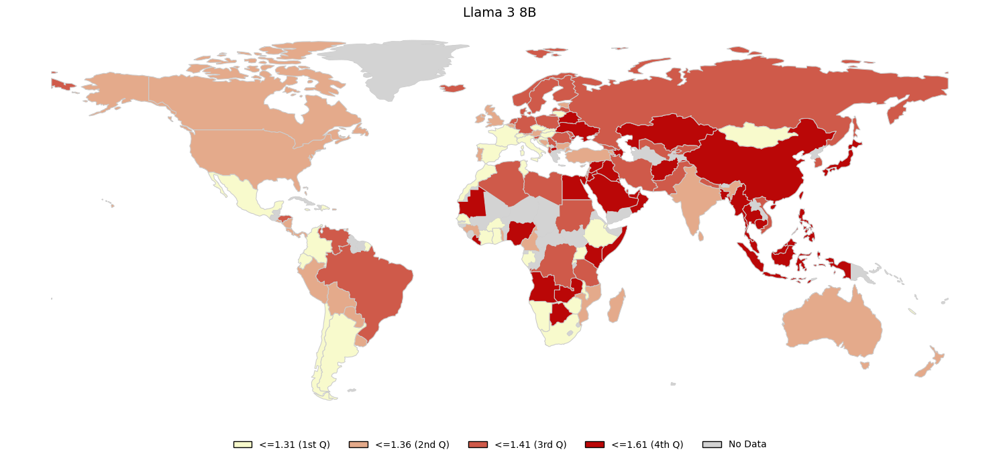

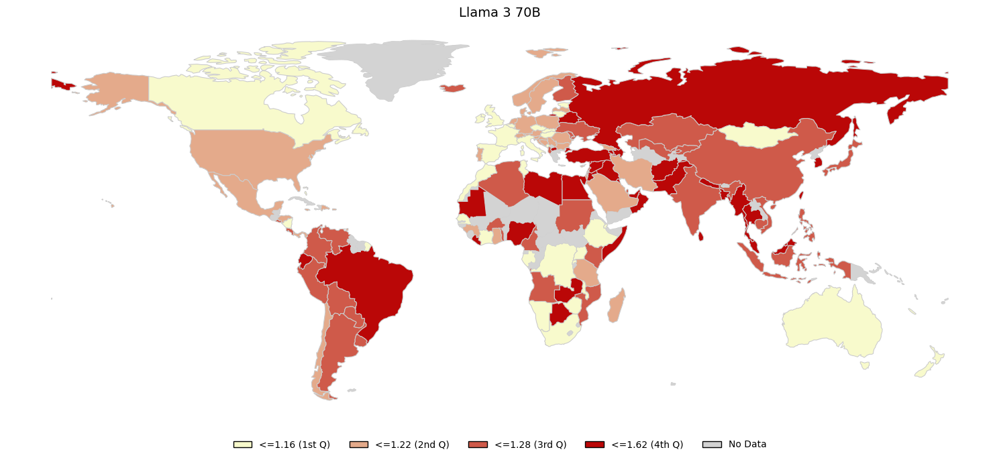

...

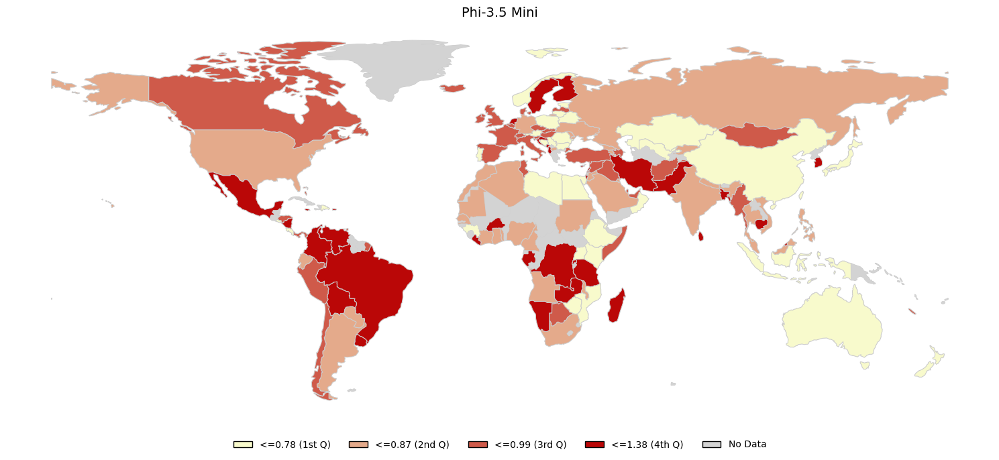

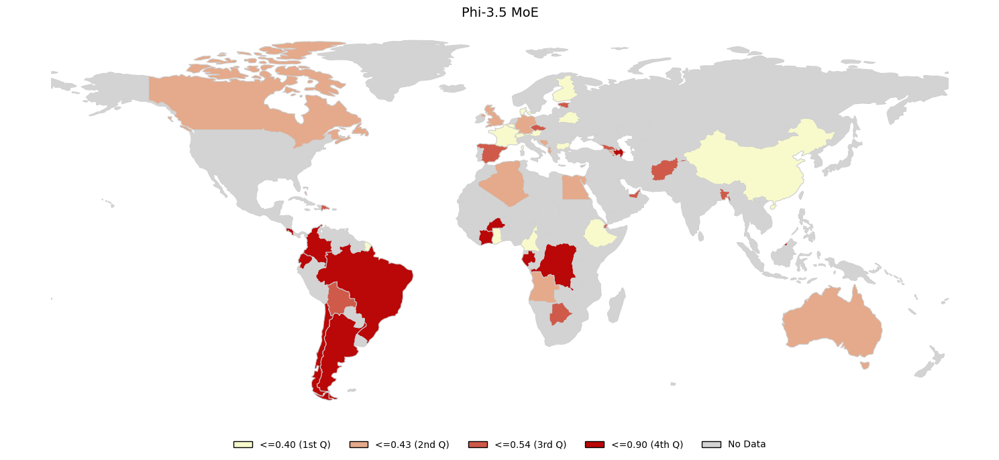

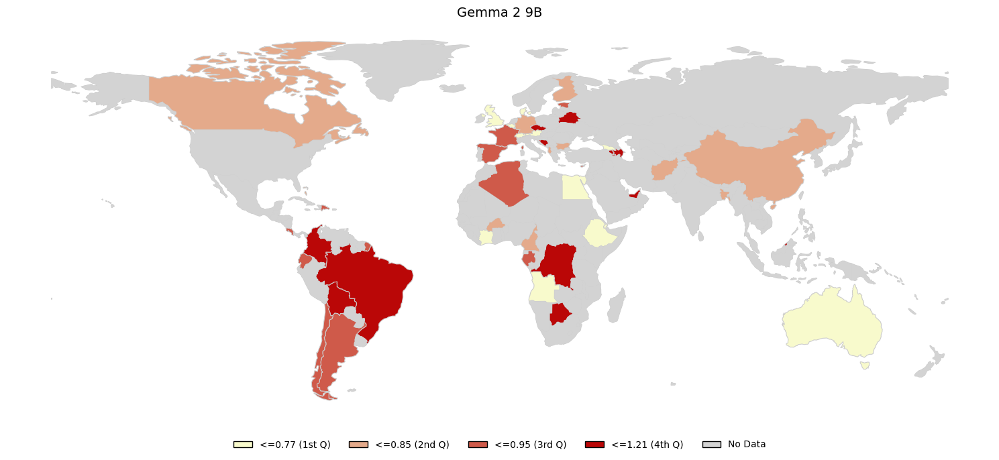

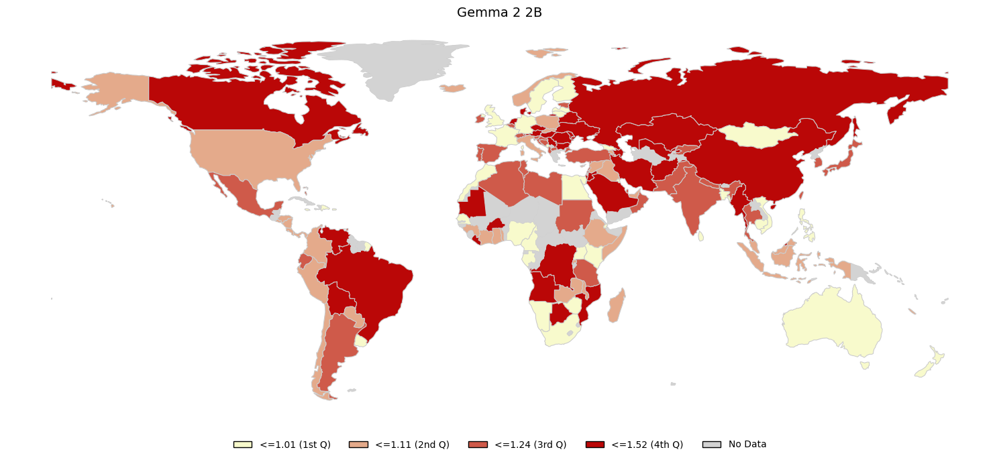

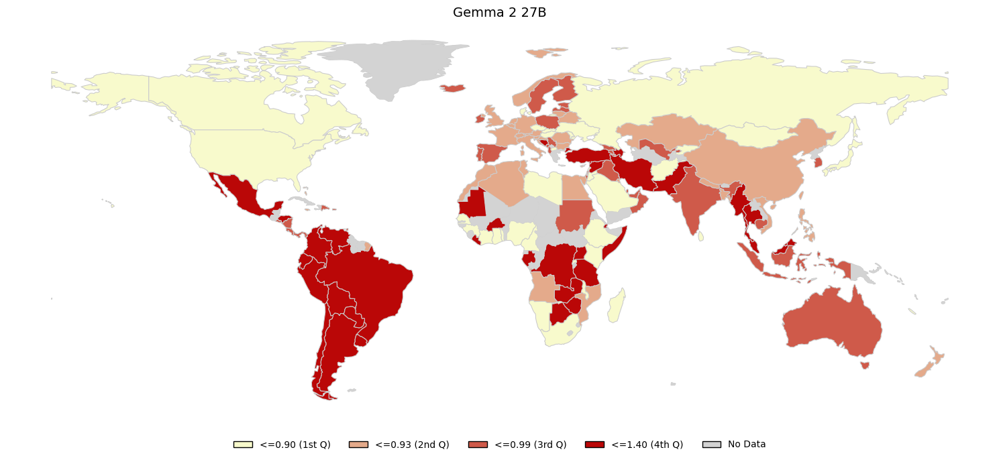

In [9]:
for model in MODELS:
    a, b = get_map_matplotlib_country(model, False)

## Other

In [10]:
from multi_tp.models_ids import (
    get_model_release_date,
    get_family,
    get_size,
    get_version,
)

acc = []
for model in MODELS:
    if model not in data:
        continue
    model_mse = {
        "model": model,
        "l2_distance": data[model]["l2_distance"].mean(),
        "release_date": get_model_release_date(model),
        "family": get_family(model),
        "size": get_size(model),
        "version": get_version(model),
    }
    acc.append(model_mse)
df = pd.DataFrame(acc)
df
# Make a

NameError: name 'data' is not defined

In [303]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# 4. Heatmap


def create_heatmap_simple(df):
    # Create a pivot table
    df["unique_version"] = df["version"] + "-" + df["size"]
    pivot = df.pivot(index="family", columns="unique_version", values="l2_distance")

    fig = px.imshow(
        pivot,
        labels=dict(x="Model Size", y="Family", color="L2 Distance"),
        title="L2 Distance Heatmap by Family and Size",
    )
    fig.update_xaxes(side="top")
    return fig


def create_heatmap(df):
    # Get unique families
    families = df["family"].unique()

    # Create subplots
    fig = make_subplots(
        rows=len(families),
        cols=1,
        subplot_titles=[f"{family} L2 Distance Heatmap" for family in families],
        vertical_spacing=0.1,
    )

    for i, family in enumerate(families, start=1):
        # Filter data for the current family
        family_df = df[df["family"] == family]

        # Create a pivot table for the current family
        pivot = family_df.pivot(
            index="version", columns="size_numeric", values="l2_distance"
        )

        # Create heatmap for the current family
        heatmap = go.Heatmap(
            z=pivot.values,
            x=pivot.columns,
            y=pivot.index,
            colorscale="RdYlGn_r",
            colorbar=dict(title="L2 Distance") if i == len(families) else None,
        )

        fig.add_trace(heatmap, row=i, col=1)

        # Update axes labels
        fig.update_xaxes(title_text="Model Size", row=i, col=1)
        fig.update_yaxes(title_text="Version", row=i, col=1)

    # Update layout
    fig.update_layout(
        height=300 * len(families),
        width=800,
        title_text="L2 Distance Heatmaps by Family",
    )

    return fig


heatmap = create_heatmap_simple(df)


parallel_coords.show()
heatmap.show()

NameError: name 'parallel_coords' is not defined